In [35]:
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.feature import corner_harris, corner_peaks
import seaborn as sns
from skimage.color import rgb2gray
import numpy as np
import cv2
from corners import corner_response
from utils import compute_gradients
import cv2
import numpy as np
import matplotlib.pyplot as plt
from distances import normalize_descriptor
from Ransac import Ransac
from parameters import N_ITERATIONS, ERROR, THRESHOLD_MATCHES, SAMPLE_SIZE, MIN_DISTANCE, K
import itertools
import pandas as pd
from tqdm import tqdm  


# Read Images, preprocess them.

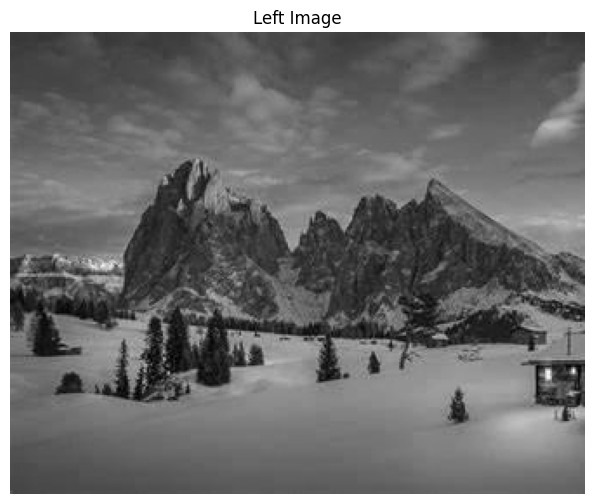

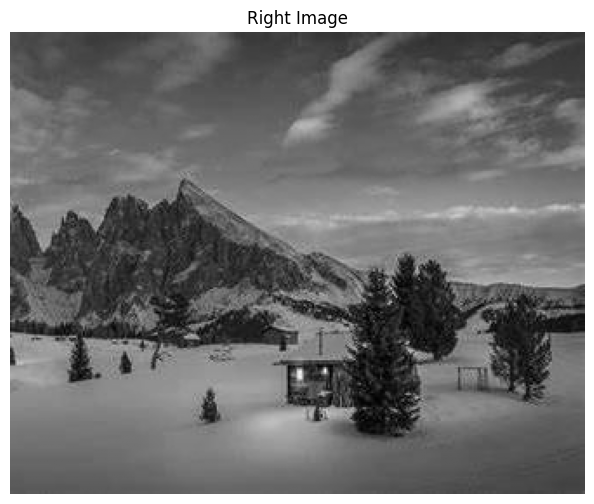

In [28]:
# load the image
def show_image(img, title='Image', cmap='gray'):
    plt.figure(figsize=(8, 6))
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()


left_img = io.imread('data/alps_left.jpg')
right_img = io.imread('data/alps_right.jpg')
left_gray = color.rgb2gray(left_img)
right_gray = color.rgb2gray(right_img)

show_image(left_gray, 'Left Image')
show_image(right_gray, 'Right Image')



We normalize the image, in order to make them comparable and in order to facilitate the process.

We want to see if the image is well balanced, for example if the histogram is concentrated around low values of if is concentrated on high values. 

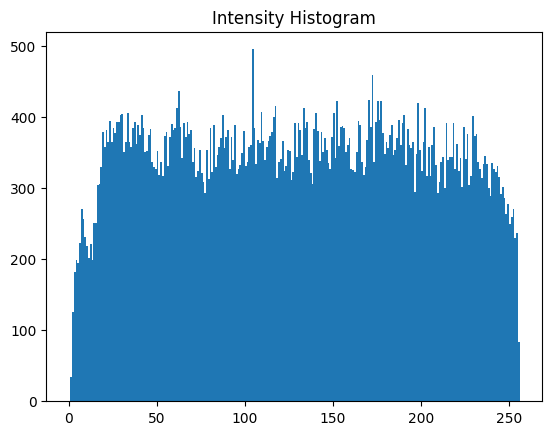

In [29]:
! pip install opencv-python
# Histogram Equalization
left_gray_8bit = (left_gray * 255).astype(np.uint8)
right_gray_8bit = (right_gray * 255).astype(np.uint8)
left_gray = cv2.equalizeHist(left_gray_8bit)
right_gray = cv2.equalizeHist(right_gray_8bit)

left_gray = cv2.GaussianBlur(left_gray, (3, 3), 1)
right_gray = cv2.GaussianBlur(right_gray, (3, 3), 1)


plt.hist(left_gray.ravel(), bins=256, range=[0,256])
plt.title('Intensity Histogram')
plt.show()



We can see that the image covers almost the entire grayscale spectrum indicating a good contrast range. 
Furthermore there are no strong peaks and there is a balanced brightness. 
Because of this we don't need histogram equalization. 

# 1. Harris Corner Detection

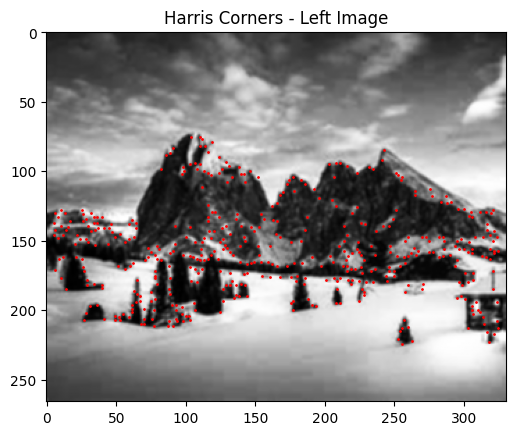

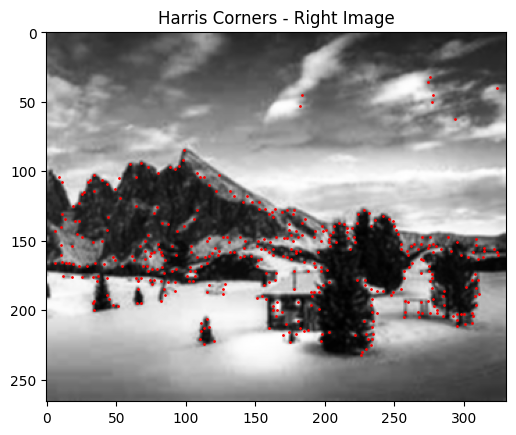

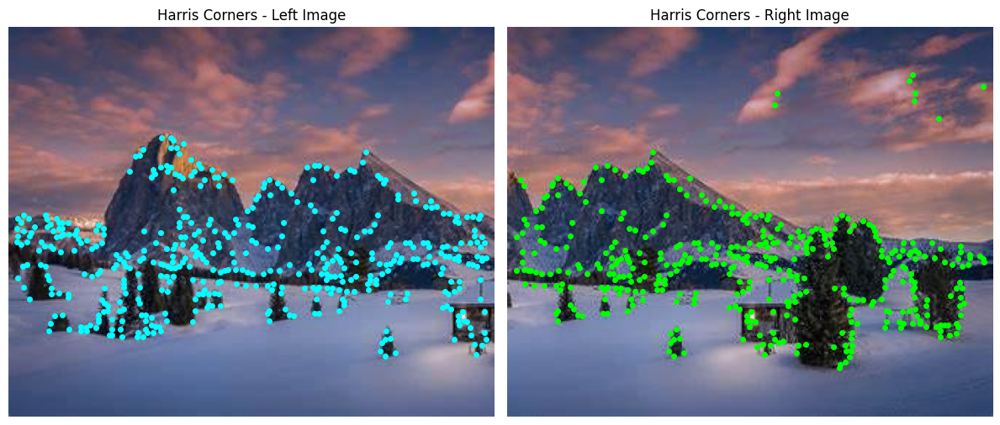

In [30]:
# Apply Harris 

def harris_corners(image, sigma=1, k=0.005, min_distance = 1, size=10,  plot=False, image_name='Image'):
    harris_response = corner_harris(image, sigma=sigma)
    keypoints = corner_peaks(harris_response,  exclude_border=size//2, min_distance=min_distance,  threshold_rel=k) 

    if plot:
        fig, ax = plt.subplots()
        ax.imshow(image, cmap='gray')
        ax.plot(keypoints[:, 1], keypoints[:, 0], 'r.', markersize=2)
        ax.set_title(f'Harris Corners - {image_name}')
        plt.show()

    return keypoints
left_corners = harris_corners(left_gray, plot=True, image_name='Left Image')
right_corners = harris_corners(right_gray, plot=True, image_name='Right Image')

# Plotting the Harris corners on the images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(left_img)
axes[0].plot(left_corners[:, 1], left_corners[:, 0], color='cyan', marker='o',
             linestyle='None', markersize=4, label='Harris Corners')
axes[0].set_title('Harris Corners - Left Image')
axes[0].axis('off')

axes[1].imshow(right_img)
axes[1].plot(right_corners[:, 1], right_corners[:, 0], color='lime', marker='o',
             linestyle='None', markersize=4, label='Harris Corners')
axes[1].set_title('Harris Corners - Right Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()

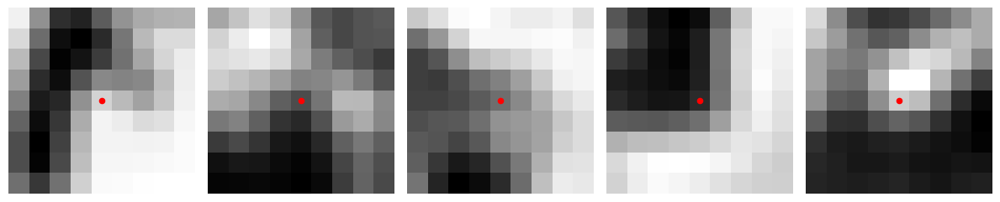

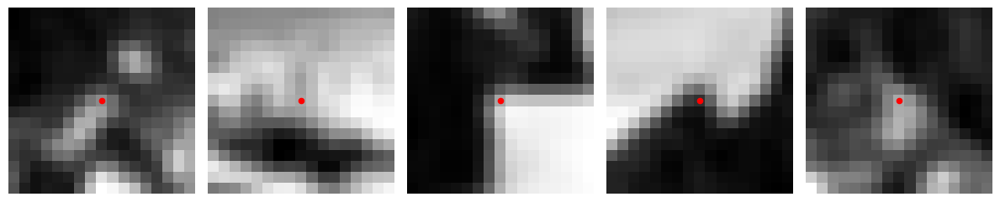

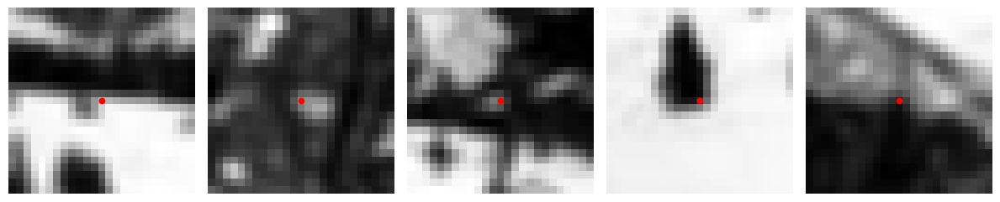

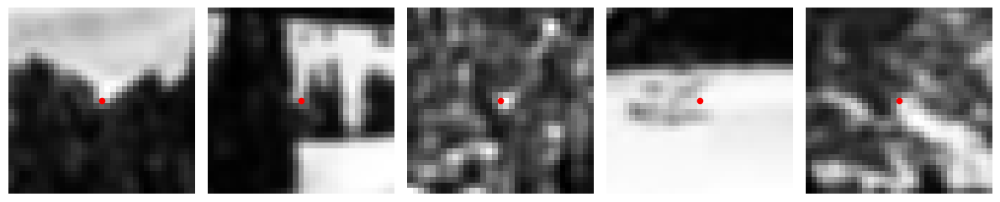

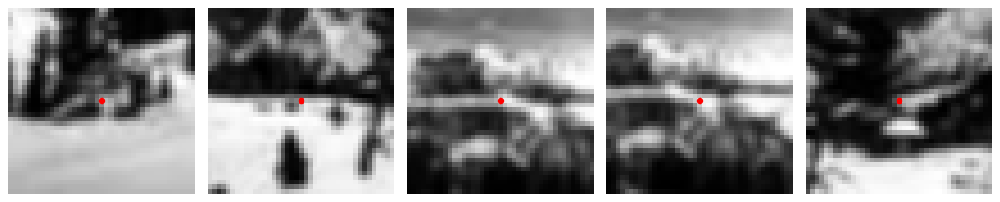

In [31]:
from patches import extract_patches, show_random_patches_with_keypoints

patch_size = [8, 16, 24, 32, 40]
for size in patch_size:
    patches, valid_coords = extract_patches(left_gray, left_corners, size)
    show_random_patches_with_keypoints(patches, size, num_show=5)




Because we know that gradients have multiple dominant directions, we want to be sure that in the patches they change with respect to all directions. 


GUARDA PROMPT GPT PER LA R ANALYSIS

patch size:  8, mean:  88.54 std:  85.62411109027643
patch size:  16, mean:  92.02083333333333 std:  85.63889536481396
patch size:  24, mean:  93.46808510638297 std:  85.96234976537255
patch size:  32, mean:  89.62222222222222 std:  84.81726472282475
patch size:  40, mean:  89.62222222222222 std:  84.81726472282475
patch size:  48, mean:  90.88372093023256 std:  85.50485075382419
patch size:  56, mean:  91.6829268292683 std:  85.9257873284792
patch size:  64, mean:  96.33333333333333 std:  85.54840684974744
{8: [np.uint8(6), np.uint8(243), np.uint8(0), np.uint8(1), np.uint8(161), np.uint8(79), np.uint8(196), np.uint8(117), np.uint8(33), np.uint8(0), np.uint8(0), np.uint8(133), np.uint8(1), np.uint8(205), np.uint8(92), np.uint8(51), np.uint8(0), np.uint8(110), np.uint8(72), np.uint8(24), np.uint8(0), np.uint8(0), np.uint8(244), np.uint8(0), np.uint8(96), np.uint8(48), np.uint8(4), np.uint8(159), np.uint8(148), np.uint8(125), np.uint8(121), np.uint8(254), np.uint8(39), np.uint8(1), np.ui

C:\Users\Aurora Pia Ghiardell\AppData\Local\Temp\ipykernel_19736\3101363087.py:30: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(distribution_R, labels=[f"Patch {patch_size}" for patch_size in R_values_patch_size], showmeans=True)


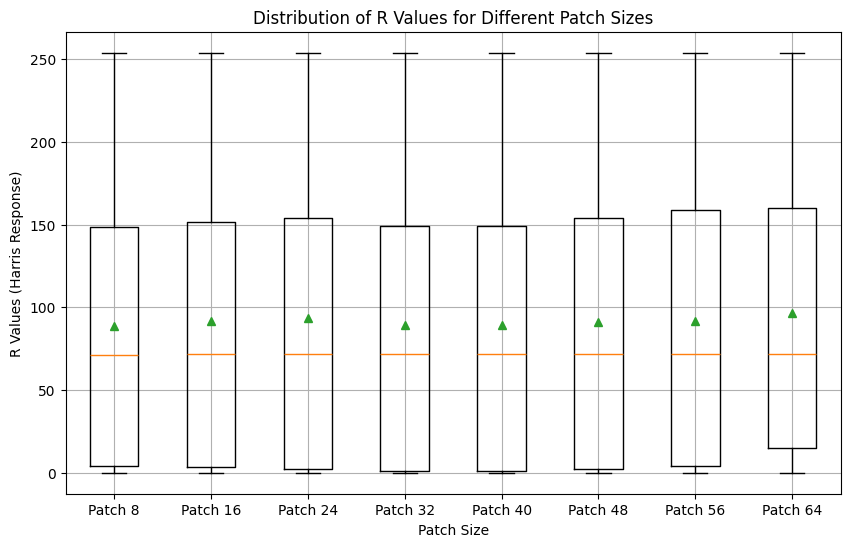

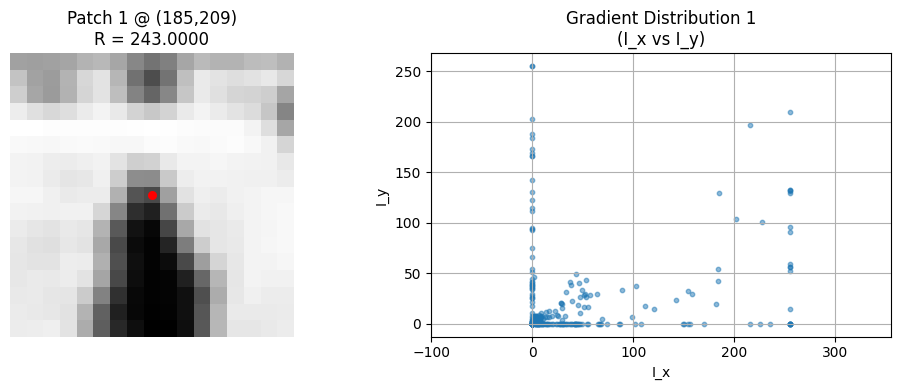

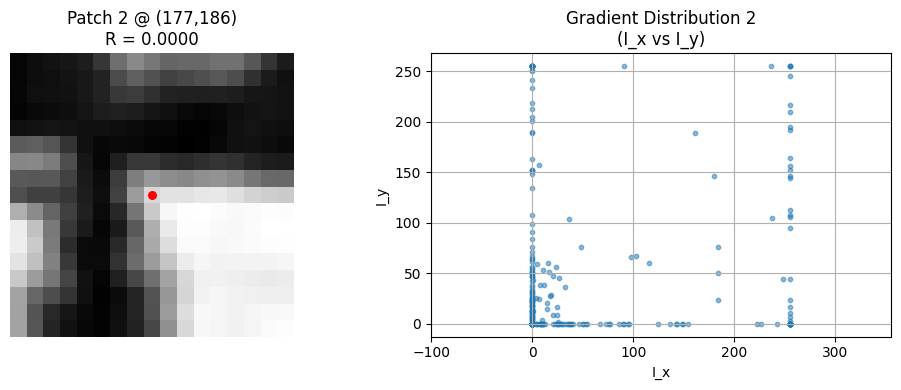

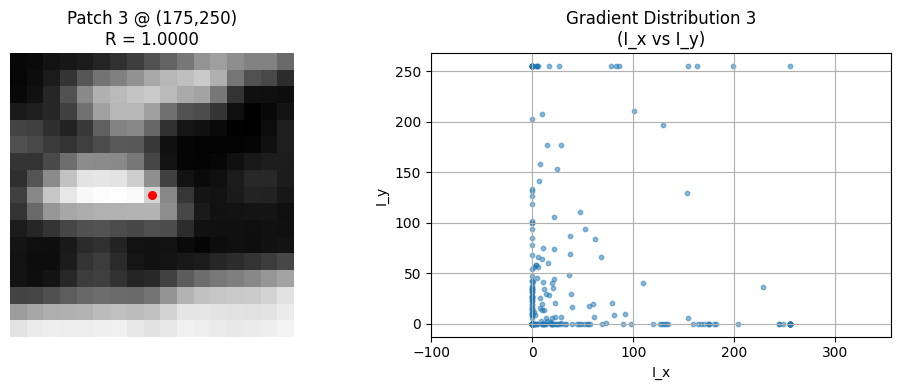

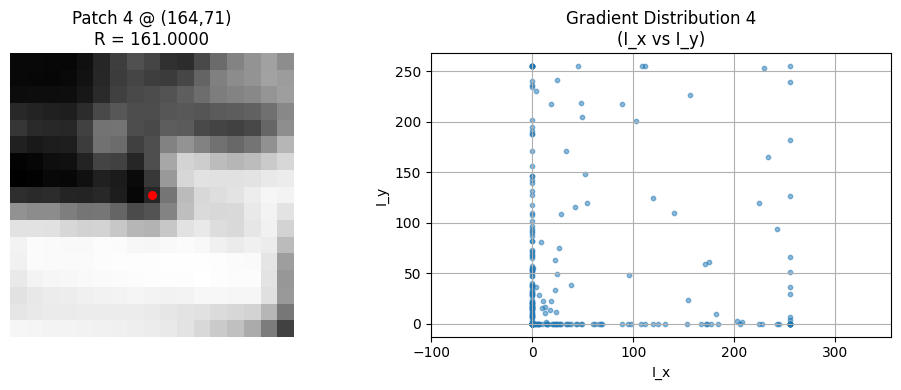

...

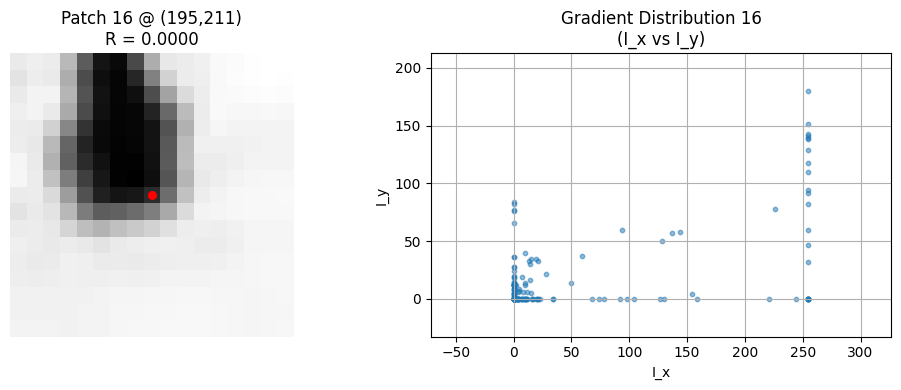

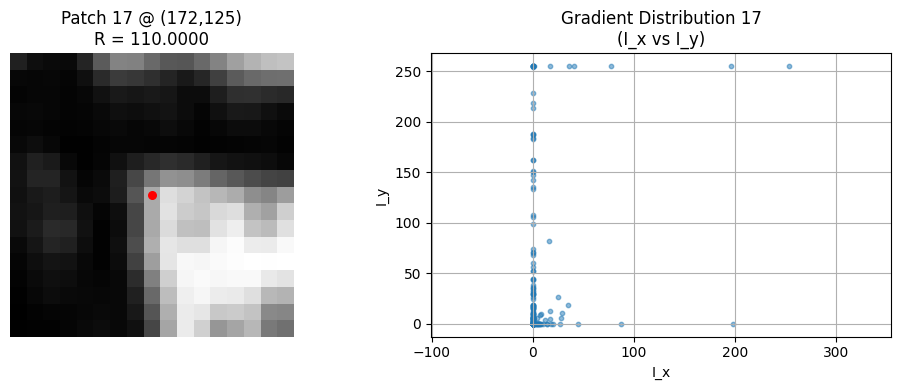

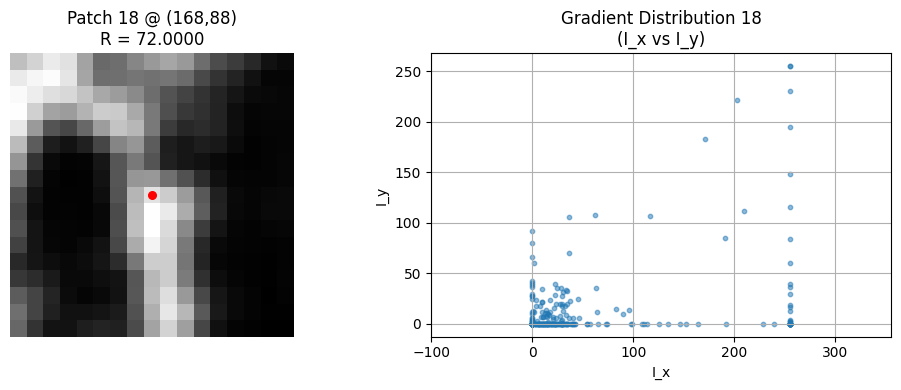

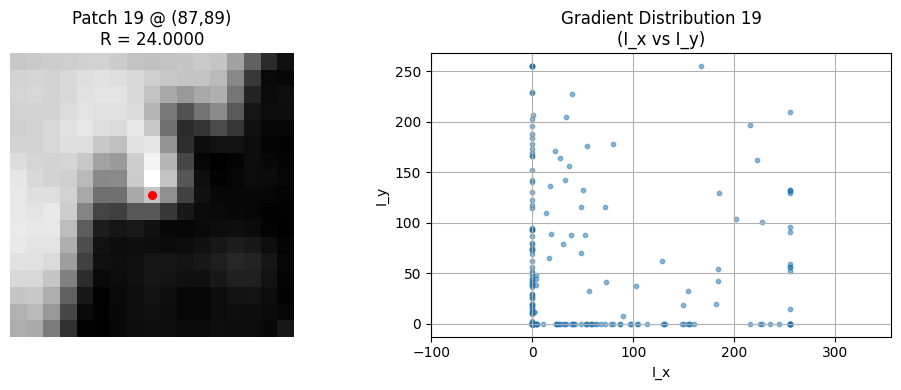

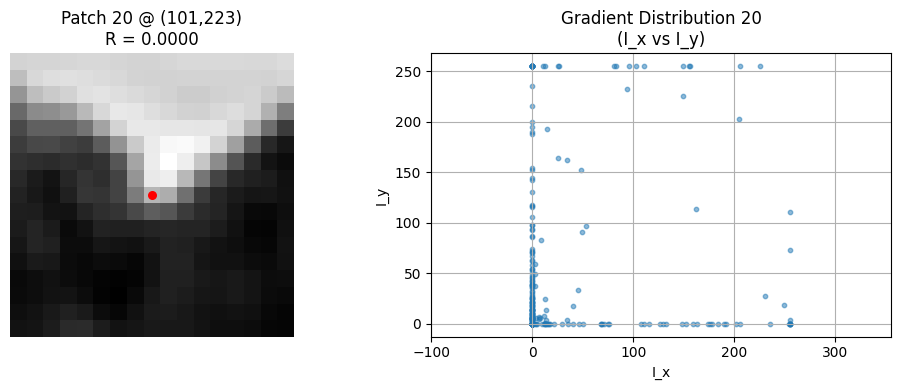

In [32]:


R_values_patch_size = {}
Patch_gradients_patch_size = {}
patch_sizes = [8, 16, 24, 32, 40, 48, 56, 64]

for patch_size in patch_sizes:
    R_values = [] 
    half_size = patch_size // 2
    patch_gradients = []
    valid_keypoints = []  
    for y, x in left_corners[:50]:  
        if y - half_size < 0 or y + half_size >= left_gray.shape[0] or \
        x - half_size < 0 or x + half_size >= left_gray.shape[1]:
            continue  
        
        patch = left_gray[y - half_size : y + half_size + 1, x - half_size : x + half_size + 1]
        Ix, Iy = compute_gradients(patch)
        R = corner_response(patch, Ix, Iy)
        patch_gradients.append((Ix.flatten(), Iy.flatten()))
        valid_keypoints.append((y, x))
        R_values.append(R[half_size, half_size]) 

    print("patch size: ", f"{patch_size},", "mean: ", np.mean(R_values), "std: ", np.std(R_values))

    R_values_patch_size[patch_size] = R_values
    Patch_gradients_patch_size[patch_size] = patch_gradients

print(R_values_patch_size)
plt.figure(figsize=(10, 6))
distribution_R = [R_values_patch_size[patch_size] for patch_size in R_values_patch_size]
plt.boxplot(distribution_R, labels=[f"Patch {patch_size}" for patch_size in R_values_patch_size], showmeans=True)
plt.title("Distribution of R Values for Different Patch Sizes")
plt.xlabel("Patch Size")
plt.ylabel("R Values (Harris Response)")
plt.grid(True)
plt.show()

num_to_show = 20
patch_size = 16
half_size = patch_size // 2
for i in range(min(num_to_show, len(patch_gradients))):
    y, x = valid_keypoints[i]
    patch = left_gray[y - half_size : y + half_size + 1, x - half_size : x + half_size + 1]
    
    Ix_flat = Patch_gradients_patch_size[patch_size][i][0]
    Iy_flat = Patch_gradients_patch_size[patch_size][i][1]
    R_val = R_values_patch_size[patch_size][i]

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(patch, cmap='gray')
    plt.scatter(half_size, half_size, color='red', s=30)  
    plt.title(f'Patch {i+1} @ ({y},{x})\nR = {R_val:.4f}')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.scatter(Ix_flat, Iy_flat, s=10, alpha=0.5)
    plt.xlabel('I_x')
    plt.ylabel('I_y')
    plt.title(f'Gradient Distribution {i+1}\n(I_x vs I_y)')
    plt.grid(True)
    plt.axis('equal')
    
    plt.tight_layout()
    plt.show() 


## Sensitivity Analysis

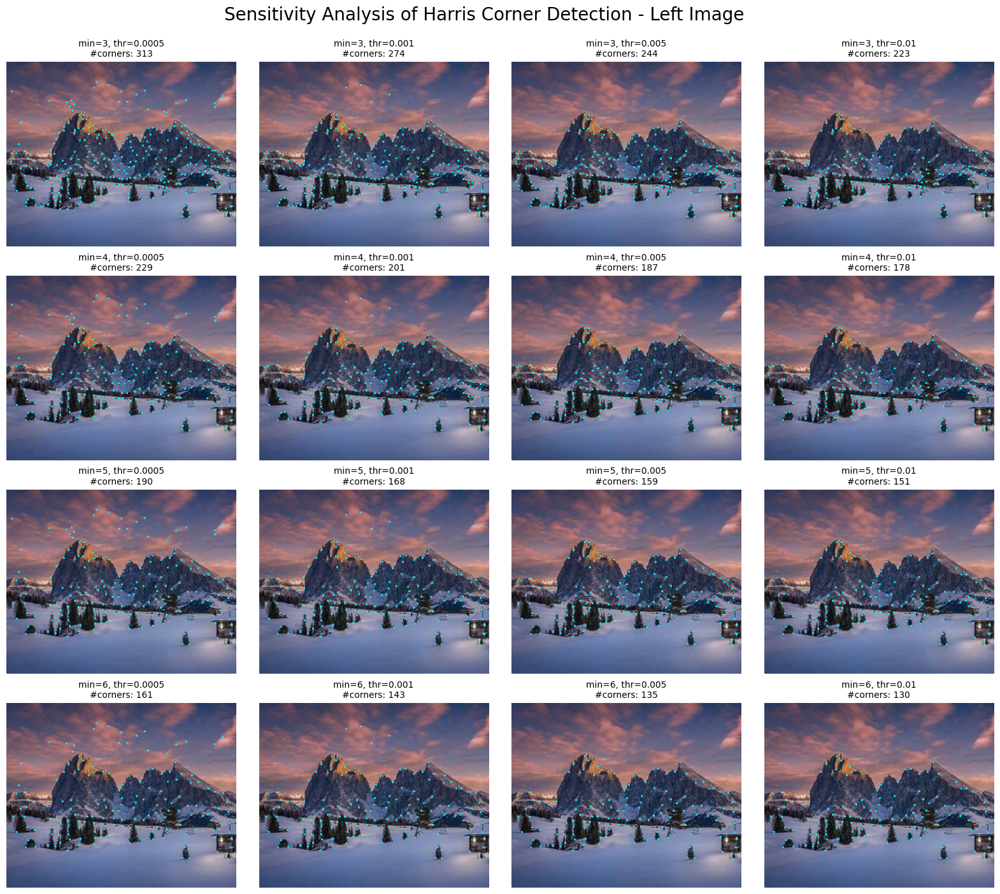

In [34]:
import matplotlib.pyplot as plt
from skimage.feature import corner_peaks

min_distances = [3, 4, 5, 6]
threshold_rels = [0.0005, 0.001, 0.005, 0.01]

fig, axes = plt.subplots(len(min_distances), len(threshold_rels), figsize=(20, 16))
fig.suptitle("Sensitivity Analysis of Harris Corner Detection - Left Image", fontsize=20)

for i, min_dist in enumerate(min_distances):
    for j, threshold in enumerate(threshold_rels):
        coords = harris_corners(left_gray, sigma=1, min_distance = min_dist, k=threshold, plot=False, image_name='Image')
        ax = axes[i, j]
        ax.imshow(left_img, cmap='gray')
        ax.plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',
        linestyle='None', markersize=1)
        ax.set_title(f"min={min_dist}, thr={threshold}\n#corners: {len(coords)}", fontsize=10)
        ax.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.1, top=0.93) # Reduced spacing values
plt.show()





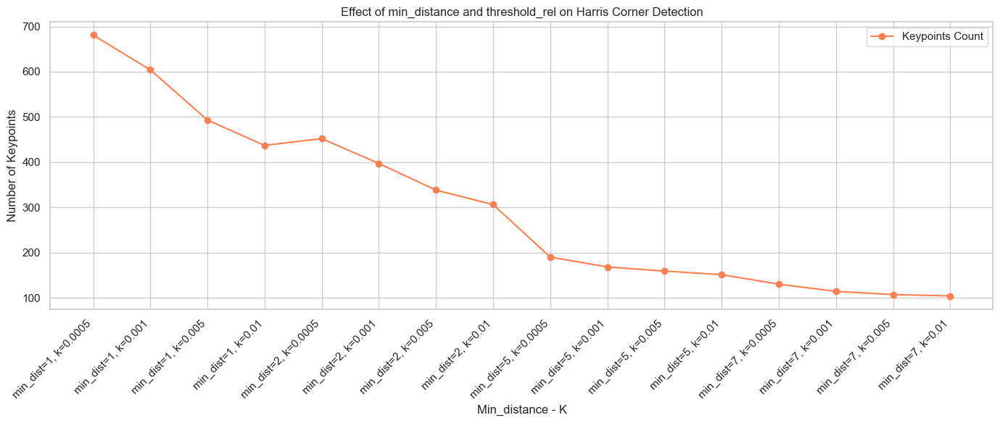

In [ ]:
min_distances = [1, 2, 5, 7]
threshold_rels = [0.0005, 0.001, 0.005, 0.01]
results = []
for min_dist in min_distances:
    for thr in threshold_rels:
        coords = harris_corners(left_gray, min_distance=min_dist, threshold=thr)
        label = f"min_dist={min_dist}, k={thr}"
        results.append({
            "Min_distance - K": label,
            "Number of Keypoints": len(coords)
        })

plt.figure(figsize=(14, 6))
sns.set(style="whitegrid")

sorted_results = sorted(results, key=lambda x: x["Min_distance - K"])
x = [r["Min_distance - K"] for r in sorted_results]
y = [r["Number of Keypoints"] for r in sorted_results]

plt.plot(x, y, marker='o', linestyle='-', color='coral', label="Keypoints Count")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Min_distance - K")
plt.ylabel("Number of Keypoints")
plt.title("Effect of min_distance and threshold_rel on Harris Corner Detection")
plt.tight_layout()
plt.legend()
plt.show()


Seing the distribution of the dustances of the best matches for different patch sizes.

Patch size: 8, Number of matches: 54
Patch size: 16, Number of matches: 39
Patch size: 24, Number of matches: 28
Patch size: 32, Number of matches: 15
Patch size: 40, Number of matches: 0
Patch size: 48, Number of matches: 0
Patch size: 64, Number of matches: 0


C:\Users\Aurora Pia Ghiardell\AppData\Local\Temp\ipykernel_19736\3340267900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(distances_per_patch_size, labels=[f"Patch {size}" for size in results.keys()], showmeans=True)


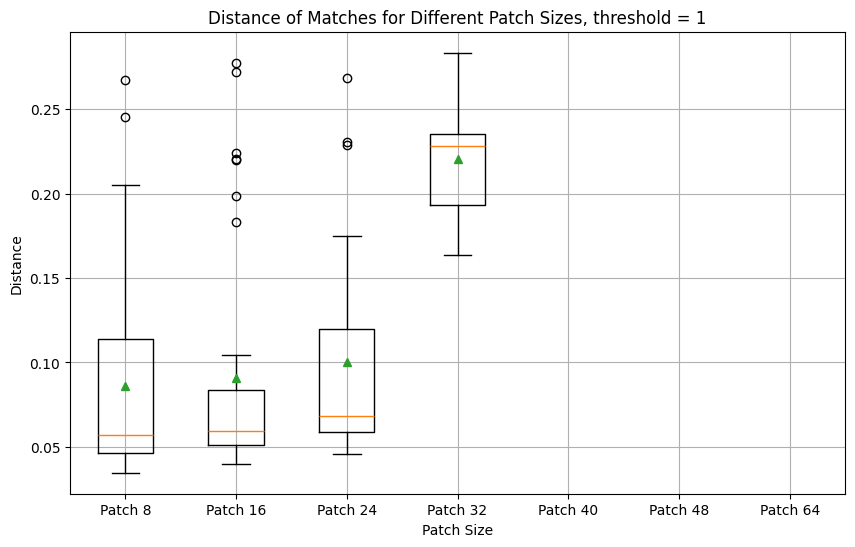

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from distances import get_matches
from parameters import THRESHOLD_MATCHES, MIN_DISTANCE, K

def plot_box_plots_for_distances(results):
    distances_per_patch_size = []
    for patch_size, _ in results.items():
        distances = []

        for _, values in results[patch_size].items():
            distances.append(values[1])
        distances_per_patch_size.append(distances)

    plt.figure(figsize=(10, 6))
    plt.boxplot(distances_per_patch_size, labels=[f"Patch {size}" for size in results.keys()], showmeans=True)
    plt.title("Distance of Matches for Different Patch Sizes, threshold = 1")
    plt.xlabel("Patch Size")
    plt.ylabel("Distance")
    plt.grid(True)
    plt.show()  

def harris_corners(image, sigma=1, k=0.005, min_distance = 1, size=10,  plot=False, image_name='Image'):
    harris_response = corner_harris(image, sigma=sigma)
    keypoints = corner_peaks(harris_response,  exclude_border=size//2, min_distance=min_distance,  threshold_rel=k) 

    if plot:
        fig, ax = plt.subplots()
        ax.imshow(image, cmap='gray')
        ax.plot(keypoints[:, 1], keypoints[:, 0], 'r.', markersize=2)
        ax.set_title(f'Harris Corners - {image_name}')
        plt.show()

    return keypoints


def sift_descriptor_from_coords(image1, image2, threshold = 0.3, k=0.0005 , min_distance = 6, size = 32, plot=True):
    kp1 = harris_corners(image1,  k = k, min_distance=min_distance, size=size, image_name='Left Image')
    kp2 = harris_corners(image2, k = k, min_distance=min_distance, size=size,  image_name='Right Image')

    sift = cv2.SIFT_create()
    keypoints1 = [cv2.KeyPoint(x=float(corner[1]), y=float(corner[0]), size=size) for corner in kp1]
    keypoints2 = [cv2.KeyPoint(x=float(corner[1]), y=float(corner[0]), size=size) for corner in kp2]
    kp1 , des1 = sift.compute(image1, keypoints1)
    kp2 , des2 = sift.compute(image2, keypoints2)
    matches = get_matches(des1, des2, threshold=threshold)

    return kp1, des1, kp2, des2, matches


patch_sizes = [8, 16, 24,  32, 40, 48, 64]

results = {}
for patch_size in patch_sizes:
    _, des1, _, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray,  size = patch_size, threshold = THRESHOLD_MATCHES, k = K, min_distance = MIN_DISTANCE, plot =False)
    print(f"Patch size: {patch_size}, Number of matches: {len(good_matches)}")
    results[patch_size] = good_matches

plot_box_plots_for_distances(results)

# 2. SIFT DESCRIPTOR


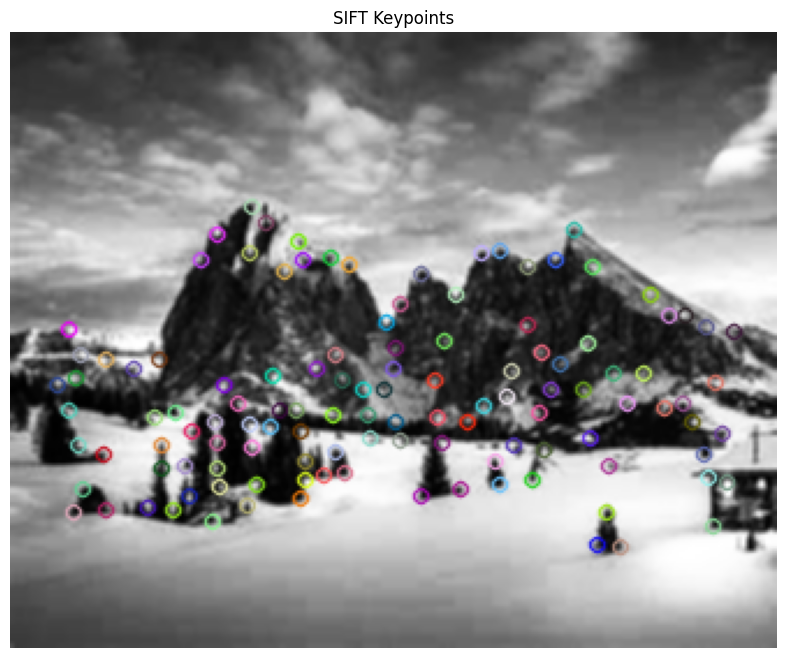

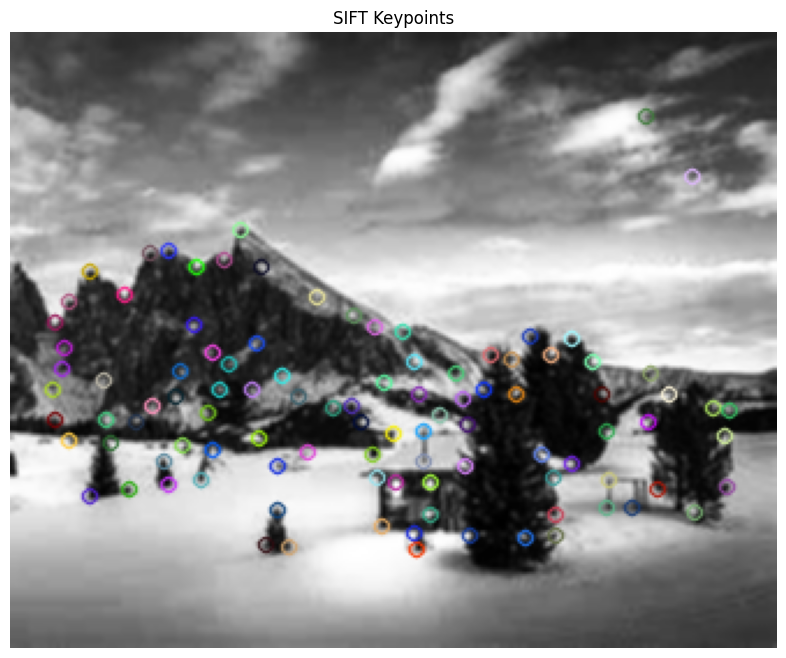

In [ ]:
from parameters import THRESHOLD_MATCHES, MIN_DISTANCE,  K
sift = cv2.SIFT_create()
keypoints_l, des1, keypoints_r, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray, threshold = THRESHOLD_MATCHES, k = K, min_distance=MIN_DISTANCE, plot =False)

img_with_keypoints = cv2.drawKeypoints(
    left_gray,
    keypoints_l,
    left_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

img_with_keypoints = cv2.drawKeypoints(
    right_gray,
    keypoints_r,
    right_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()



# 3 Similarity matrices

In [ ]:
from distances import compute_euclidian_distances

euclidean_distances = compute_euclidian_distances(des1, des2)    
print("Number of good matches: ", len(good_matches), "threshold: ", THRESHOLD_MATCHES)
print("Euclidean distances: ", euclidean_distances.shape)
print("Euclidean distances: ", euclidean_distances)


Number of good matches:  15 threshold:  0.3
Euclidean distances:  (120, 101)
Euclidean distances:  [[0.74898035 0.82632396 0.90473913 ... 1.18101696 1.14136985 1.41150724]
 [0.70594441 0.98255342 0.99499053 ... 0.88098244 1.08437676 1.28457643]
 [0.71375558 0.88537605 0.95837167 ... 1.14273801 1.10314552 1.38237617]
 ...
 [1.05093003 1.28780529 1.30534054 ... 0.95441523 0.66318593 0.90159528]
 [1.16509368 1.40595805 1.42045567 ... 1.14835247 0.82407408 1.03570993]
 [1.33673513 1.46650006 1.47532156 ... 0.90127309 1.07098559 0.52712378]]


# 4. Select Best Matches

Good matches:  {3: (np.int64(8), np.float64(0.2333518762885788)), 12: (np.int64(14), np.float64(0.2267477068073821)), 20: (np.int64(17), np.float64(0.2546020297931868)), 37: (np.int64(29), np.float64(0.19636079681551366)), 41: (np.int64(33), np.float64(0.16351007825121408)), 70: (np.int64(52), np.float64(0.23685707764874273)), 75: (np.int64(54), np.float64(0.17490320558260025)), 76: (np.int64(60), np.float64(0.2833414962312677)), 82: (np.int64(68), np.float64(0.2282841842103953)), 88: (np.int64(70), np.float64(0.27054764112217045)), 91: (np.int64(73), np.float64(0.23118954944831402)), 101: (np.int64(82), np.float64(0.22858552893277584)), 105: (np.int64(85), np.float64(0.18989695927683284)), 112: (np.int64(91), np.float64(0.21011042402019475)), 115: (np.int64(97), np.float64(0.17591461534413744))}
Offset:  331


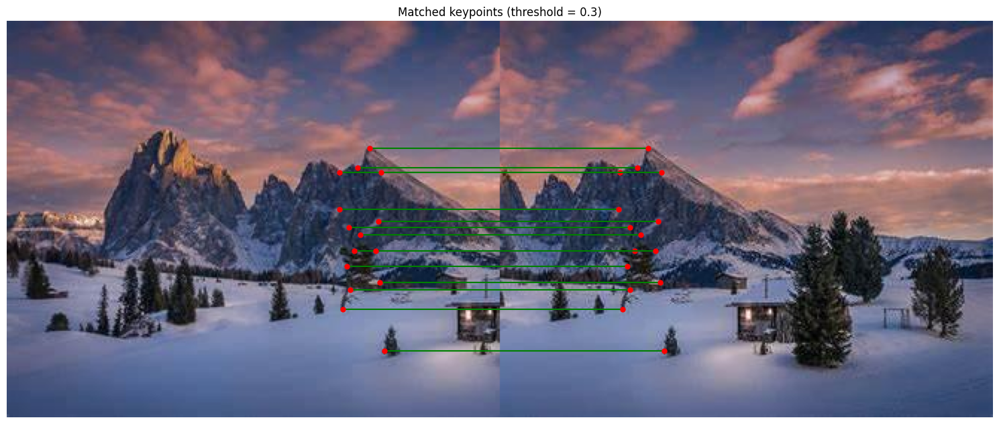

In [ ]:

print("Good matches: ", good_matches) 
num_matches = 200
sorted_matches = sorted(good_matches.items(), key=lambda x: x[1][1])
first_100_matches = sorted_matches[:num_matches]
# print("First 100 matches: ", first_100_matches)
combined_img = np.hstack((left_img, right_img))
offset = left_img.shape[1]
print("Offset: ", offset)
fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(combined_img)
ax.axis('off')

for el in first_100_matches:
    i, j = el[0], el[1][0]
    pt1 = keypoints_l[i].pt  
    pt2 = keypoints_r[j].pt
    
    x1, y1 = pt1
    x2, y2 = pt2[0] + offset, pt2[1]  
    ax.plot([x1, x2], [y1, y2], 'g-', linewidth=1.5)
    ax.plot(x1, y1, 'ro', markersize=5)
    ax.plot(x2, y2, 'ro', markersize=5)
    

plt.title(f'Matched keypoints (threshold = {threshold})')
plt.tight_layout()
plt.show()



# Sensitivity Analysis

Threshold: 0.3
Number of good matches:  15 threshold:  0.3
Threshold: 0.4
Number of good matches:  23 threshold:  0.4
Threshold: 0.5
Number of good matches:  30 threshold:  0.5
Threshold: 0.6
Number of good matches:  62 threshold:  0.6
Threshold: 0.7
Number of good matches:  83 threshold:  0.7
Threshold:  0.3 mean:  0.22028021131822048 std:  0.03393130714790626
Threshold:  0.4 mean:  0.2682548009909542 std:  0.07423678830077476
Threshold:  0.5 mean:  0.3121710577661278 std:  0.10311675104824562
Threshold:  0.6 mean:  0.43948254251726 std:  0.14349443853568303
Threshold:  0.7 mean:  0.49315237172493265 std:  0.15527025509287162


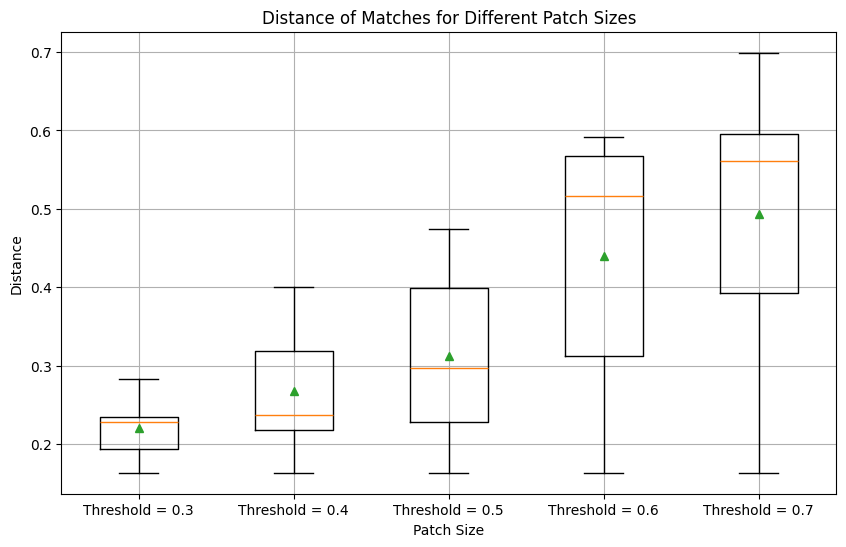

Number of matches:  25 threshold:  1.5
Number of matches:  50 threshold:  1.5
Number of matches:  75 threshold:  1.5
Number of matches:  100 threshold:  1.5
Number of matches:  120 threshold:  1.5
Number of matches:  120 threshold:  1.5
n:  25 mean:  0.28156015688809616 std:  0.084300254912576
n:  50 mean:  0.4060445425295081 std:  0.14050529419324911
n:  75 mean:  0.4729663061816519 std:  0.14980554953617803
n:  100 mean:  0.5333134358318145 std:  0.16716473078329694
n:  150 mean:  0.5797529393949616 std:  0.18487547444012817
n:  200 mean:  0.5797529393949616 std:  0.18487547444012817


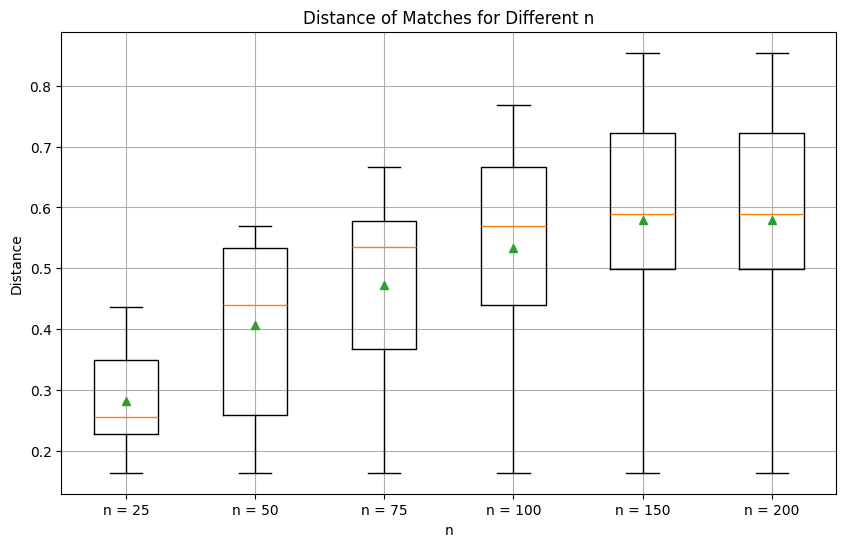

In [ ]:
from distances import plot_box_plots_distances_threshold, plot_box_plots_distances_top_n


thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

results = {}
for threshold in thresholds:
    print(f"Threshold: {threshold}")
    keypoints_l, des1, keypoints_r, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray, threshold = threshold, k = K, min_distance=MIN_DISTANCE, plot =False)
    results[threshold] = good_matches
    print("Number of good matches: ", len(good_matches), "threshold: ", threshold)

plot_box_plots_distances_threshold(results)

top_matches = [25, 50, 75, 100, 150, 200]
results2 = {}
keypoints_l, des1, keypoints_r, des2, good_matches = sift_descriptor_from_coords(left_gray, right_gray, threshold = 1.50, k = K, min_distance=MIN_DISTANCE, plot =False)
for i in top_matches:
    sorted_matches = sorted(good_matches.items(), key=lambda x: x[1][1])
    first_100_matches = sorted_matches[:i]
    results2[i] = first_100_matches
    print("Number of matches: ", len(first_100_matches), "threshold: ", 1.50)
    

plot_box_plots_distances_top_n(results2)




# 5 RANSAC

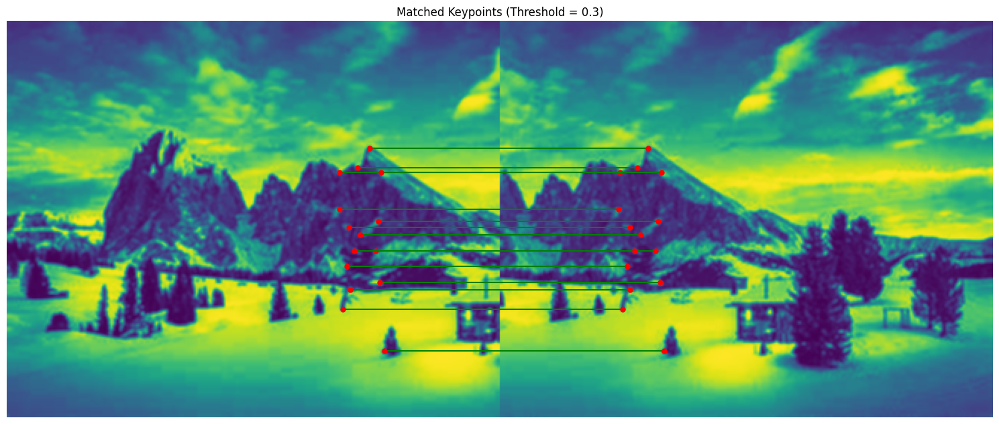

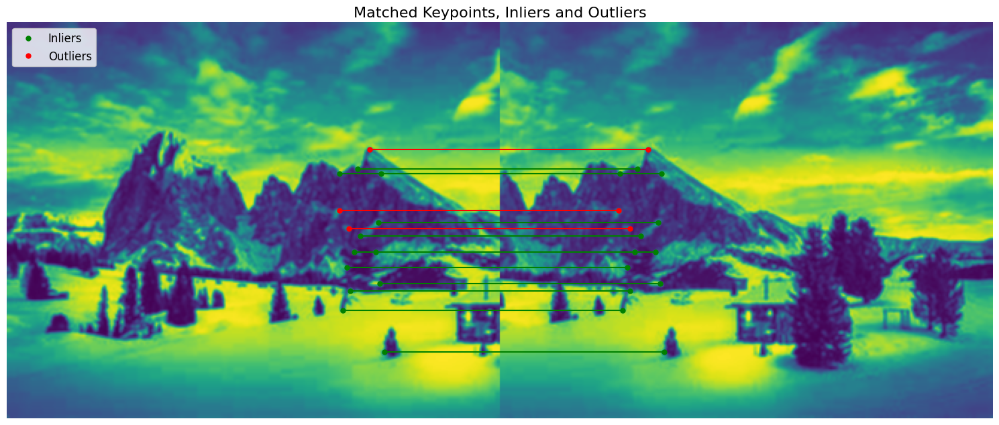

Best Translation Matrix:
 [[ 1.00000000e+00 -3.74014439e-16  1.43000000e+02]
 [-2.87894272e-14  1.00000000e+00  3.24903775e-12]
 [-2.77575790e-16 -6.09524308e-19  1.00000000e+00]]
Inliers indices: [8, 14, 17, 29, 33, 52, 68, 70, 73, 82, 85, 97]
Number of inliers: 12
Inrliers average residual: 0.0
number of outliers 3
average residual of keypoints 0.2


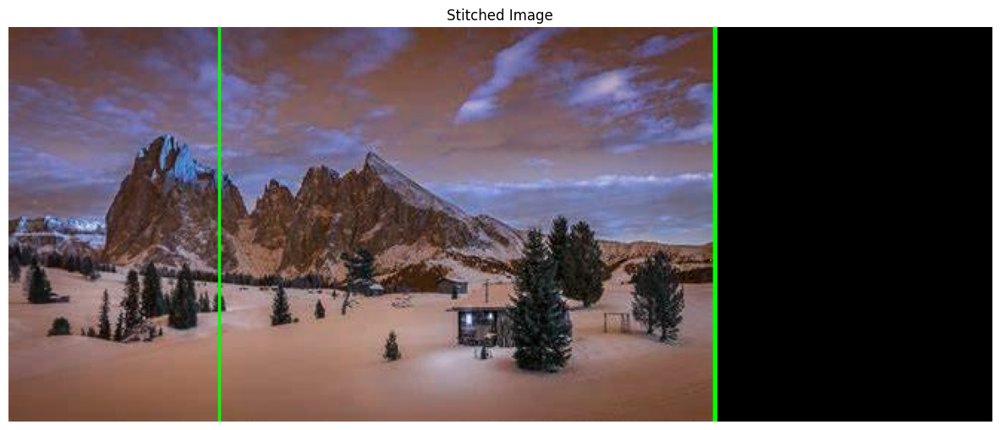

In [ ]:

combined_image = np.hstack((left_gray, right_gray))
keypoints_l, des1, keypoints_r, des2, _ = sift_descriptor_from_coords(left_gray, right_gray, threshold = 1, k = K, min_distance=MIN_DISTANCE, plot ="True")
des1_l2 = normalize_descriptor(des1)
des2_l2 = normalize_descriptor(des2)

ransac = Ransac(n_iterations=N_ITERATIONS, threshold=ERROR, threshold_matches=THRESHOLD_MATCHES, sample_size=4)
affine_matrix, inliers_rl = ransac.ransac_translation(keypoints_r, keypoints_l, des2_l2, des1_l2, right_gray, left_gray, vis_matches=True, vis_in_out=True)
print("Best Translation Matrix:\n", affine_matrix)
print("Inliers indices:", inliers_rl)
print("Number of inliers:", len(inliers_rl))
print("Inrliers average residual:", ransac.average_residual_inliers)
print("number of outliers", len(ransac.outliers))
print("average residual of keypoints", np.mean(ransac.residuals))

ransac.stitch_images(left_img, right_img, affine_matrix, borders = True)


# EXPERIMENTS


In [36]:
def test_parameter_combinations(left_gray, right_gray, parameter_combinations):

    print("Number of Combination:", len(parameter_combinations))
    results_list = []
    for i, params in tqdm(enumerate(parameter_combinations), total=len(parameter_combinations), desc="Testing Parameter Combinations"):
        THRESHOLD_MATCHES, SAMPLE_SIZE, N_ITERATIONS, ERROR, K,  PATCH_SIZE, MIN_DISTANCE= params
        keypoints_l, des1, keypoints_r, des2, _ = sift_descriptor_from_coords(left_gray, right_gray, threshold=1, k=K, min_distance=MIN_DISTANCE, size = PATCH_SIZE, plot=False)
        des1_l2 = normalize_descriptor(des1)
        des2_l2 = normalize_descriptor(des2)
        ransac = Ransac(n_iterations=N_ITERATIONS, threshold=ERROR, threshold_matches=THRESHOLD_MATCHES, sample_size=SAMPLE_SIZE)
        _, inliers_rl = ransac.ransac_translation(keypoints_r, keypoints_l, des2_l2, des1_l2, right_gray, left_gray, vis_matches=False, vis_in_out=False)
        num_outliers = len(ransac.outliers)

        results_list.append({
        'match_thr': THRESHOLD_MATCHES,
        'sample_size': SAMPLE_SIZE,
        'n_iterations': N_ITERATIONS,
        'error': ERROR,
        'corner_thr': K,
        'patch_size': PATCH_SIZE,
        'min_distance': MIN_DISTANCE,
        'In_count': len(inliers_rl),
        'Out_count': num_outliers,
        'Avg_res': np.mean(ransac.residuals),
        'Avg_In_res': ransac.average_residual_inliers,
        })


    results_df = pd.DataFrame(results_list)
    return results_df



parameter_combinations = {
    "threshold": [0.3, 0.7],
    "sample_size": [4, 6],
    "iterations": [1000, 2000],
    "error": [0.3, 0.7],
    "corner_threshold": [0.0005, 0.001],
    "patch_size": [16],
    "min_distance": [3, 5],
}
combinations = list(itertools.product(
    parameter_combinations["threshold"], 
    parameter_combinations["sample_size"], 
    parameter_combinations["iterations"], 
    parameter_combinations["error"],
    parameter_combinations["corner_threshold"],
    parameter_combinations["patch_size"],
    parameter_combinations["min_distance"]

))
results_df = test_parameter_combinations(
    left_gray, right_gray, left_img, right_img, combinations
)
results_df.to_csv("ransac_experiments.csv", index=False)



Number of Combination: 64


Testing Parameter Combinations: 100%|██████████| 64/64 [01:08<00:00,  1.07s/it]


In [37]:
experiments_df = pd.read_csv("ransac_experiments.csv")

max_min_values = {
    'In_count': {'max': experiments_df['In_count'].max(), 'min': experiments_df['In_count'].min()},
    'Out_count': {'max': experiments_df['Out_count'].max(), 'min': experiments_df['Out_count'].min()},
    'Avg_res': {'max': experiments_df['Avg_res'].max(), 'min': experiments_df['Avg_res'].min()},
    'Avg_In_res': {'max': experiments_df['Avg_In_res'].max(), 'min': experiments_df['Avg_In_res'].min()}
}

max_min_rows = {
    column: {
        'max_row': experiments_df[experiments_df[column] == max_min_values[column]['max']],
        'min_row': experiments_df[experiments_df[column] == max_min_values[column]['min']]
    }
    for column in max_min_values
}
for column, rows in max_min_rows.items():
        print(f"\nSummary for Max Row of {column}:")
        summary = rows['max_row'].describe()
        formatted_summary = summary.apply(lambda col: col.map(lambda x: f"{x:.2f}" if isinstance(x, (float, int)) else x) if col.dtype.kind in 'fi' else col)
        print(formatted_summary)

        print(f"\nSummary for Min Row of {column}:")
        summary = rows['min_row'].describe()
        formatted_summary = summary.apply(lambda col: col.map(lambda x: f"{x:.2f}" if isinstance(x, (float, int)) else x) if col.dtype.kind in 'fi' else col)
        print(formatted_summary)




Summary for Max Row of In_count:
      match_thr sample_size n_iterations error corner_thr patch_size  \
count      1.00        1.00         1.00  1.00       1.00       1.00   
mean       0.70        6.00      2000.00  0.70       0.00      16.00   
std         nan         nan          nan   nan        nan        nan   
min        0.70        6.00      2000.00  0.70       0.00      16.00   
25%        0.70        6.00      2000.00  0.70       0.00      16.00   
50%        0.70        6.00      2000.00  0.70       0.00      16.00   
75%        0.70        6.00      2000.00  0.70       0.00      16.00   
max        0.70        6.00      2000.00  0.70       0.00      16.00   

      min_distance In_count Out_count Avg_res Avg_In_res  
count         1.00     1.00      1.00    1.00       1.00  
mean          3.00    91.00     28.00    0.63       0.29  
std            nan      nan       nan     nan        nan  
min           3.00    91.00     28.00    0.63       0.29  
25%           3.00    

# EXPERIMENTS WITH SOME IMAGES

(313, 328)
(313, 225)
Detected 1636 keypoints.


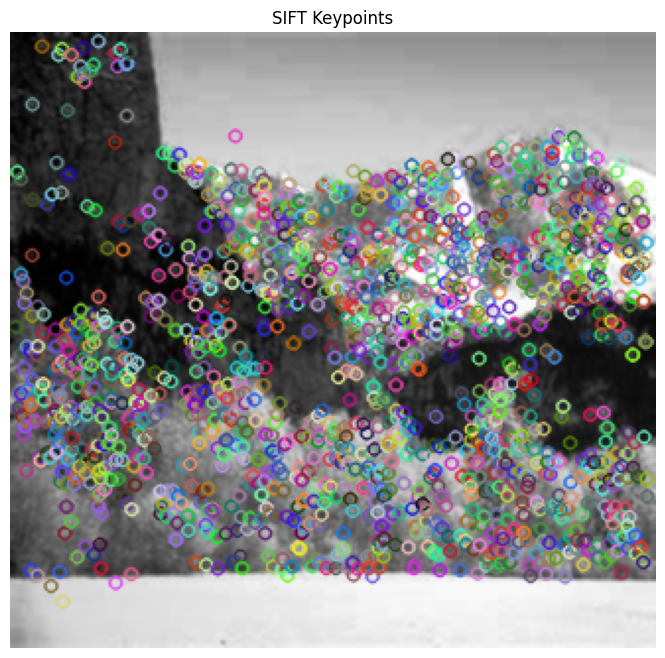

Detected 695 keypoints.


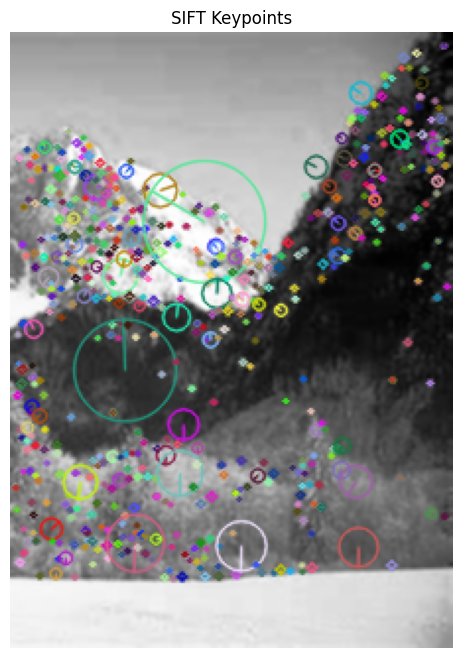

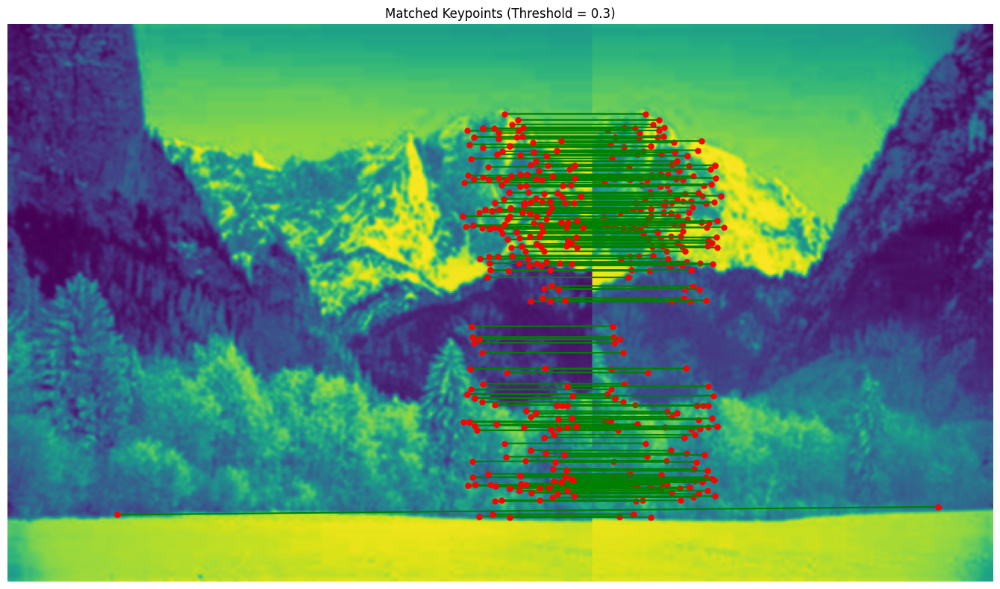

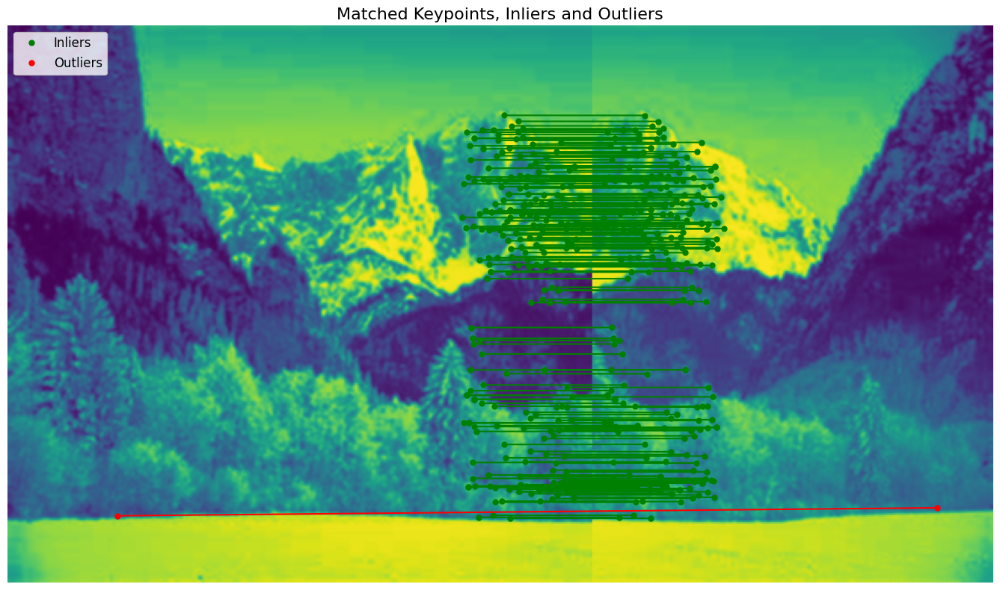

Best Translation Matrix:
 [[ 9.71981208e-01  2.38836165e-03  2.49110010e+02]
 [-1.46693580e-02  9.98278288e-01  5.03998440e-01]
 [-8.84120670e-05  9.08187283e-06  1.00000000e+00]]
Inliers indices: [13, 15, 16, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 50, 51, 53, 54, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 95, 96, 97, 98, 102, 103, 104, 105, 107, 108, 109, 110, 111, 112, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 143, 145, 146, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 168, 169, 170, 171, 173, 174, 175, 176, 178, 179, 181, 182, 183, 185, 186, 187, 188, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 217, 218, 219, 220, 221, 223, 224, 225, 228, 229, 231, 232, 233, 236, 

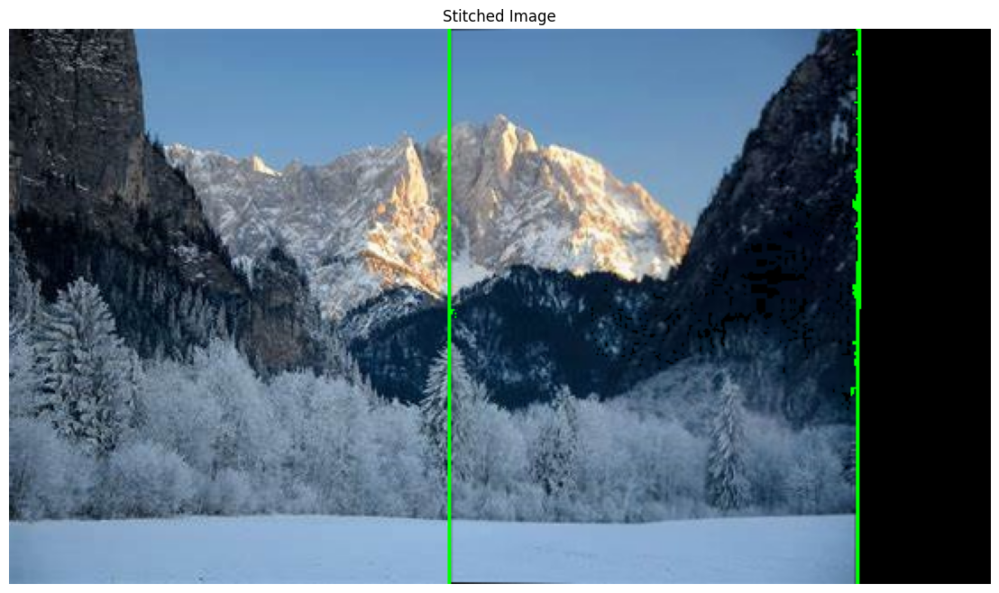

In [38]:
left_img = cv2.imread('Data\\snow_left.jpeg')  # Carica l'immagine di sinistra
right_img = cv2.imread('Data/snow_right.jpeg')  # Carica l'immagine di destra


# plt.figure(figsize=(12, 6))

# plt.subplot(1, 2, 1)
# plt.imshow(cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Left Image")
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Right Image")
# plt.axis('off')

# plt.show()

left_gray = color.rgb2gray(left_img)
right_gray = color.rgb2gray(right_img)

print(left_gray.shape)
print(right_gray.shape)

# plt.figure(figsize=(8, 6))
# plt.imshow(left_img, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

left_gray_8bit = (left_gray * 255).astype(np.uint8)
right_gray_8bit = (right_gray * 255).astype(np.uint8)
left_gray = cv2.equalizeHist(left_gray_8bit)
right_gray = cv2.equalizeHist(right_gray_8bit)
left_gray = cv2.GaussianBlur(left_gray, (3, 3), 1)
right_gray = cv2.GaussianBlur(right_gray, (3, 3), 1)


# plt.figure(figsize=(8, 6))
# plt.imshow(right_gray, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

sift = cv2.SIFT_create()
keypoints_l, descriptors_l = sift.detectAndCompute(left_gray, None, )
print(f"Detected {len(keypoints_l)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    left_gray,
    keypoints_l,
    left_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

sift = cv2.SIFT_create()
keypoints_r, descriptors_r = sift.detectAndCompute(right_gray, None)

print(f"Detected {len(keypoints_r)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    right_gray,
    keypoints_r,
    right_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

desc1_l2 = normalize_descriptor(descriptors_l)
desc2_l2 = normalize_descriptor(descriptors_r)
combined_image = np.hstack((left_gray, right_gray))
ransac = Ransac(n_iterations=N_ITERATIONS, threshold=0.5, threshold_matches=0.3, sample_size=4)
affine_matrix, inliers_rl = ransac.ransac_translation(keypoints_r, keypoints_l, desc2_l2, desc1_l2, right_gray, left_gray, vis_matches="True", vis_in_out="True")
print("Best Translation Matrix:\n", affine_matrix)
print("Inliers indices:", inliers_rl)
ransac.stitch_images(left_img, right_img, affine_matrix, borders=True)

(560, 840)
(463, 307)
Detected 7706 keypoints.


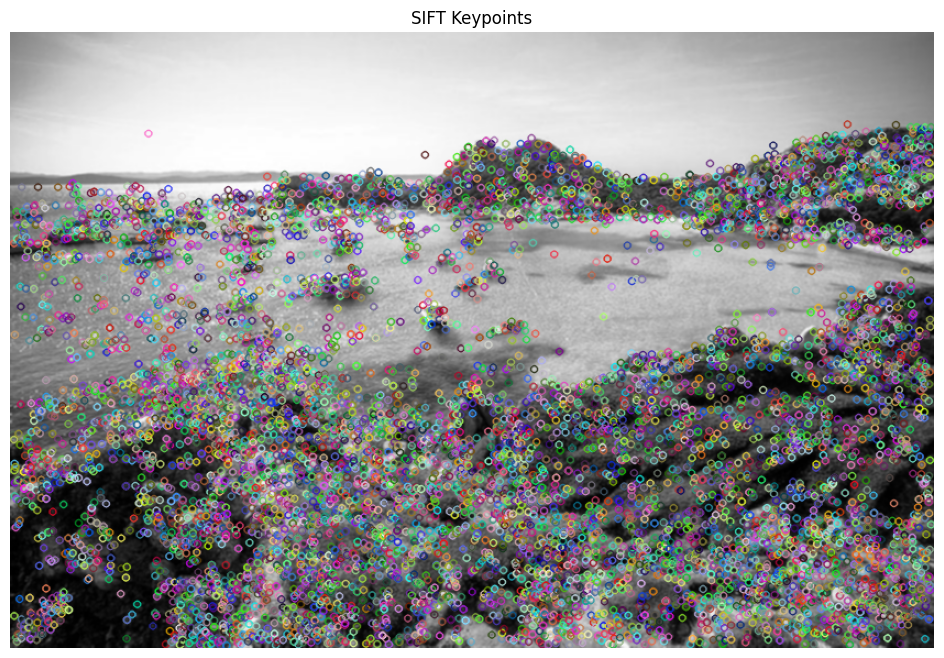

Detected 2754 keypoints.


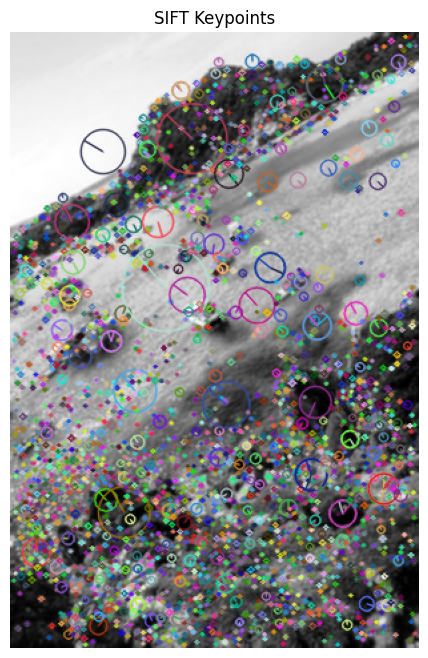

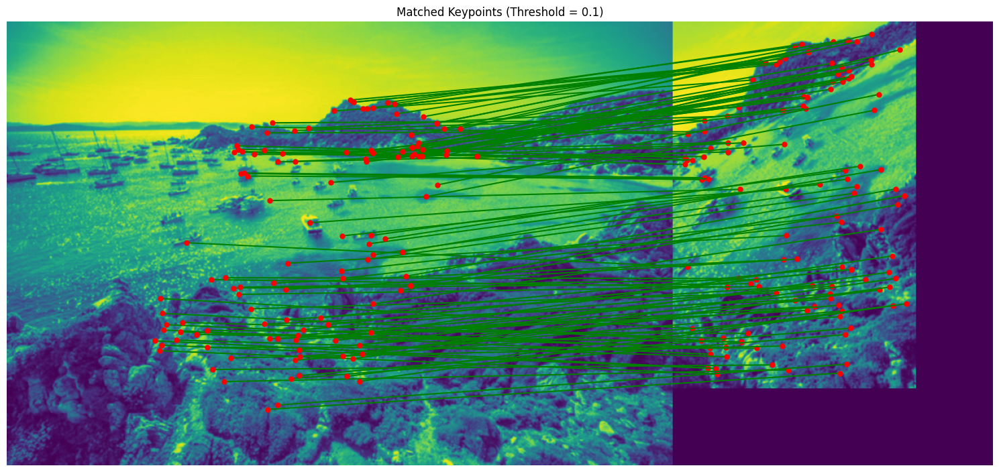

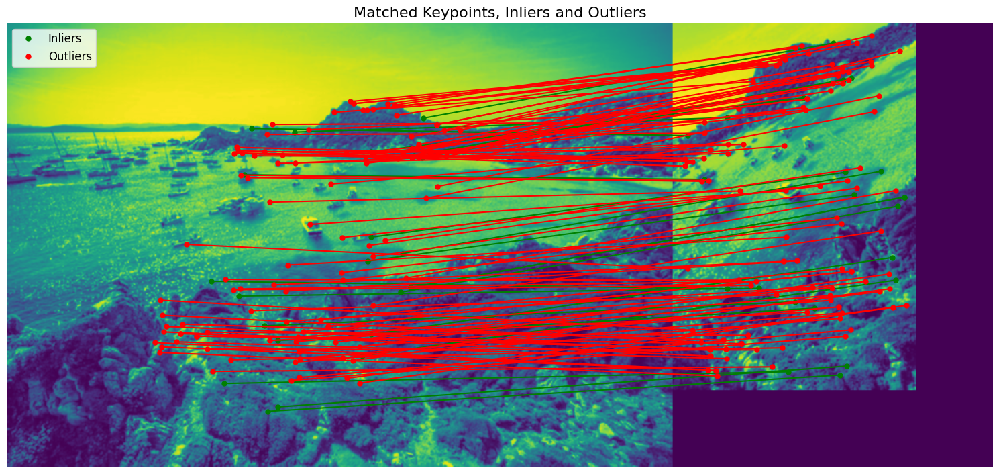

Best Translation Matrix:
 [[ 8.72591042e-01 -4.86035848e-01  3.60346447e+02]
 [ 4.85365287e-01  8.73673917e-01 -2.32796930e-01]
 [-3.50694564e-06  1.44530845e-06  1.00000000e+00]]
Inliers indices: [152, 336, 636, 640, 989, 1370, 1462, 1565, 1688, 1895, 2012, 2059, 2085, 2099, 2150, 2179, 2439, 2552, 2589, 2619, 2671, 2672]


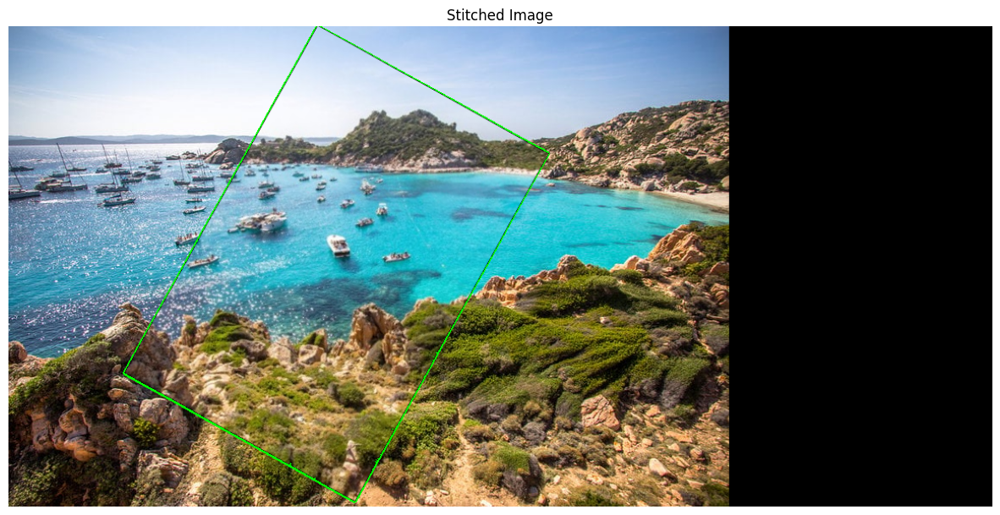

In [ ]:


left_img = cv2.imread('Data\\sardinia.jpg') 
right_img = cv2.imread('Data/sardinia2.jpg')  

# plt.figure(figsize=(12, 6))

# plt.subplot(1, 2, 1)
# plt.imshow(cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Left Image")
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB))  # Converti BGR in RGB per la visualizzazione
# plt.title("Right Image")
# plt.axis('off')

# plt.show()

left_gray = color.rgb2gray(left_img)
right_gray = color.rgb2gray(right_img)

print(left_gray.shape)
print(right_gray.shape)
# plt.figure(figsize=(8, 6))
# plt.imshow(left_img, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

left_gray_8bit = (left_gray * 255).astype(np.uint8)
right_gray_8bit = (right_gray * 255).astype(np.uint8)
left_gray = cv2.equalizeHist(left_gray_8bit)
right_gray = cv2.equalizeHist(right_gray_8bit)
left_gray = cv2.GaussianBlur(left_gray, (3, 3), 1)
right_gray = cv2.GaussianBlur(right_gray, (3, 3), 1)


# plt.figure(figsize=(8, 6))
# plt.imshow(right_gray, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')
# plt.show()

sift = cv2.SIFT_create()
keypoints_l, descriptors_l = sift.detectAndCompute(left_gray, None, )
print(f"Detected {len(keypoints_l)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    left_gray,
    keypoints_l,
    left_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

sift = cv2.SIFT_create()
keypoints_r, descriptors_r = sift.detectAndCompute(right_gray, None)

print(f"Detected {len(keypoints_r)} keypoints.")

img_with_keypoints = cv2.drawKeypoints(
    right_gray,
    keypoints_r,
    right_gray.copy(), 
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS 
)

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoints')
plt.axis('off') 
plt.show()

desc1_l2 = normalize_descriptor(descriptors_l)
desc2_l2 = normalize_descriptor(descriptors_r)
# Perform RANSAC to find the best affine transformation (mapping points from right image to left image)
ransac = Ransac(n_iterations=N_ITERATIONS, threshold=0.05, threshold_matches=0.1, sample_size=4)
affine_matrix, inliers_rl = ransac.ransac_translation(
    keypoints_r, keypoints_l, desc2_l2, desc1_l2, right_gray, left_gray, vis_matches="True", vis_in_out="True"
)
outliers_indeces = ransac.outliers
print("Best Translation Matrix:\n", affine_matrix)
print("Inliers indices:", inliers_rl)
panorama_height = left_img.shape[0]
panorama_width = left_img.shape[1] + right_img.shape[1]
panorama_size = (panorama_width, panorama_height) 
panorama = np.zeros((panorama_height, panorama_width, 3), dtype=np.uint8)
panorama[: left_img.shape[0], : left_img.shape[1]] = left_img

img2_warped = cv2.warpPerspective(right_img, affine_matrix, panorama_size)
h2, w2 = right_img.shape[:2]
corners = np.float32([[0, 0], [w2, 0], [w2, h2], [0, h2]]).reshape(-1, 1, 2)
transformed_corners = cv2.perspectiveTransform(corners, affine_matrix).astype(np.int32)
cv2.polylines(panorama, [transformed_corners], isClosed=True, color=(0, 255, 0), thickness=4)

mask = np.all(img2_warped > [0, 0, 0], axis=2)
panorama[mask] = img2_warped[mask]

plt.figure(figsize=(15, 8))
plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
plt.title("Stitched Image")
plt.axis('off')
plt.show()

